**Pooled spleen mouse samples inspection**

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import sys
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from scipy.spatial.distance import pdist
import matplotlib.pyplot as plt
# Custom functions
sys.path.append('../src')
from custom_functions import plot_clusters_2d
# Filter warnings
import warnings 
warnings.filterwarnings("ignore")

In [2]:
# load data
adata = sc.read_h5ad("../data/pooled_data/spleen_mouse.h5ad")

In [3]:
# normalize and log transform the pooled dataset so that the data are correctly scaled among them
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)    
sc.pp.highly_variable_genes(adata)
adata = adata[:, adata.var.highly_variable]

In [4]:
adata

View of AnnData object with n_obs × n_vars = 4273 × 1790
    obs: 'sample', 'n_genes'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'

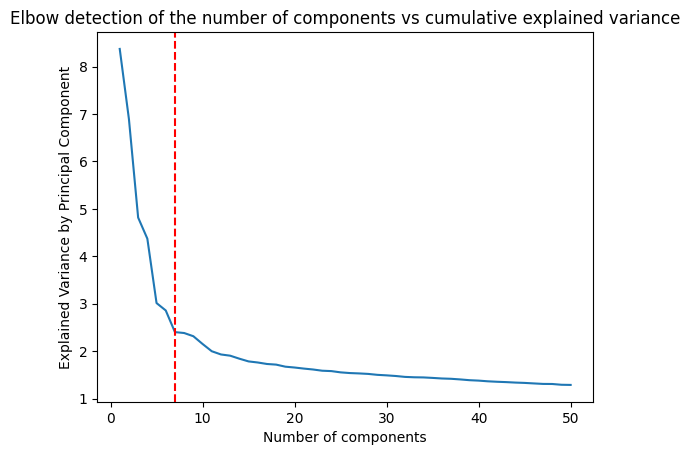

The number of principal components selected is 7


In [24]:
# The number of principal components the authors use is 20, however after experimentation 
from custom_functions import locate_elbow

adata = locate_elbow(adata, show_plot=True)

print(f"The number of principal components selected is {adata.varm['PCs'].shape[1]}")

Evaluating t-SNE parameters: 100%|██████████| 30/30 [31:09<00:00, 62.33s/it]


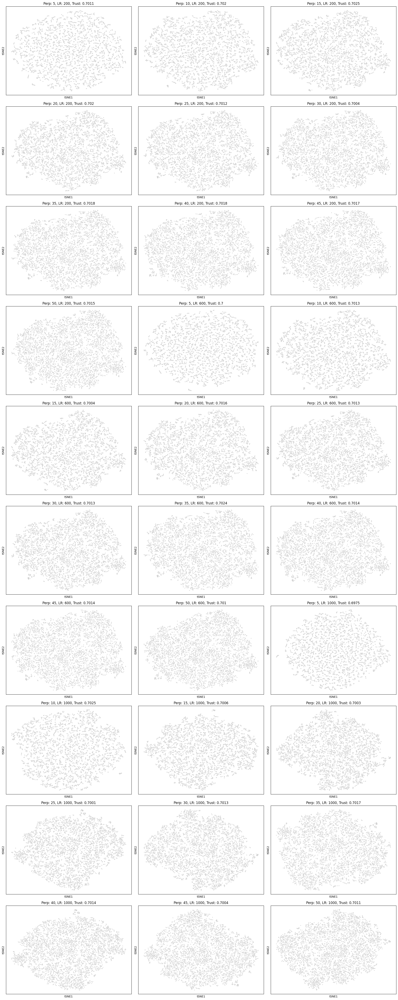

In [6]:
from custom_functions import evaluate_tsne
tsne_embeddings = evaluate_tsne(adata)

Evaluating UMAP parameters:   0%|          | 0/60 [00:00<?, ?it/s]

Evaluating UMAP parameters: 100%|██████████| 60/60 [16:58<00:00, 16.98s/it]


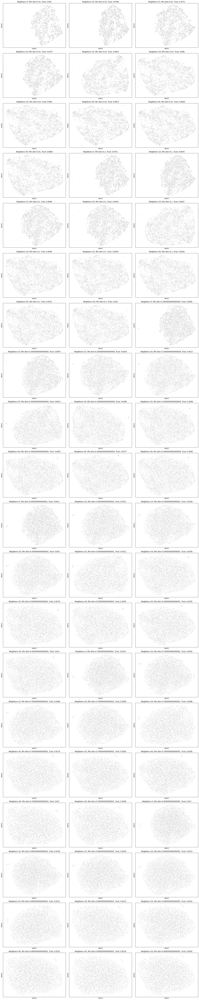

In [7]:
from custom_functions import evaluate_umap
umap_embeddings = evaluate_umap(adata)

After careful inspection, we came to the conclusion that there is no clear spacial segregation of clusters neither with t-SNE dimensionality reduction, nor with UMAP. This comes to no surprise as the authors' results also didn't depict a clear separation, but nonetheless they used a hierarchical clustering in order to identify subtypes of NK cells. Following this process, we will use the most ideal t-SNE embedding according to our judgement, which is with perplexity 30 and learning rate 600. It should be mentioned that the authors in this case only provided the t-SNE embedding of one sample separated in 3 clusters using hierachical clustering and claimed that this was the case for all murine spleen samples pooled. By a look in the `spleen_individual_inspection.ipynb`, we can also safely say that the case of 3 spacially separated clusters is not present.

**Selected embedding**

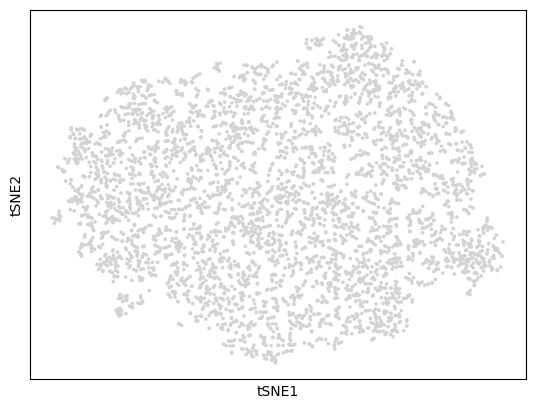

In [11]:
sc.tl.tsne(adata, perplexity=30, learning_rate=600, random_state=42)
sc.pl.tsne(adata)

In [12]:
# Get the embedding 
X_tsne = adata.obsm['X_tsne']

**K-means clustering**

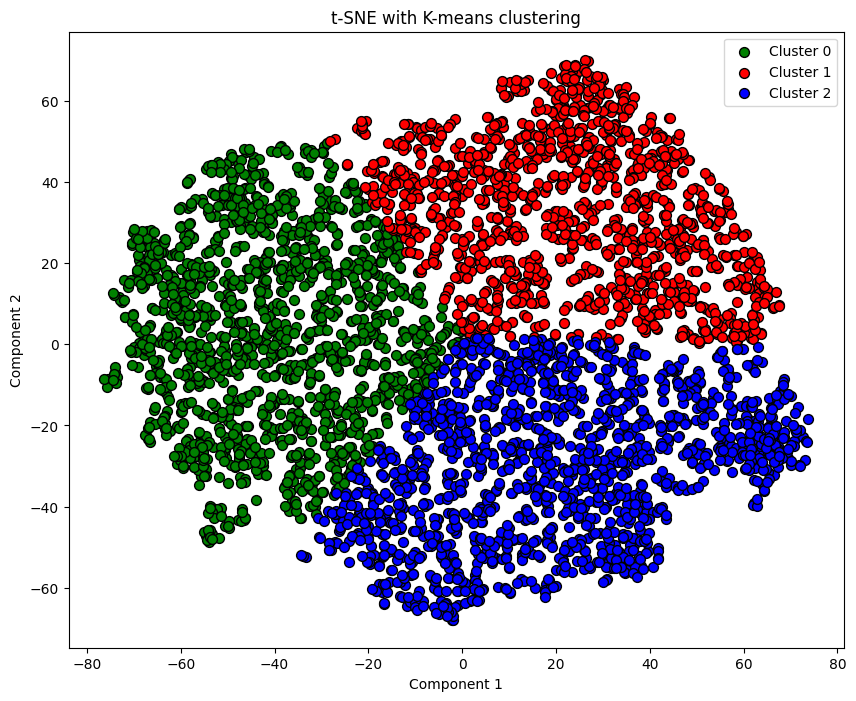

In [13]:
from custom_functions import kmeans_fit

# Parameter grid for K-means
kmeans_param_grid = {
    'n_clusters': list(range(2,12)),
    'n_init': [10, 15, 20]
}

kmeans_labels, best_params = kmeans_fit(kmeans_param_grid, X_tsne)
plot_clusters_2d(X_tsne, kmeans_labels, title="t-SNE with K-means clustering")

**GMM clustering**

Best GMM parameters: {'covariance_type': 'spherical', 'n_components': 10}


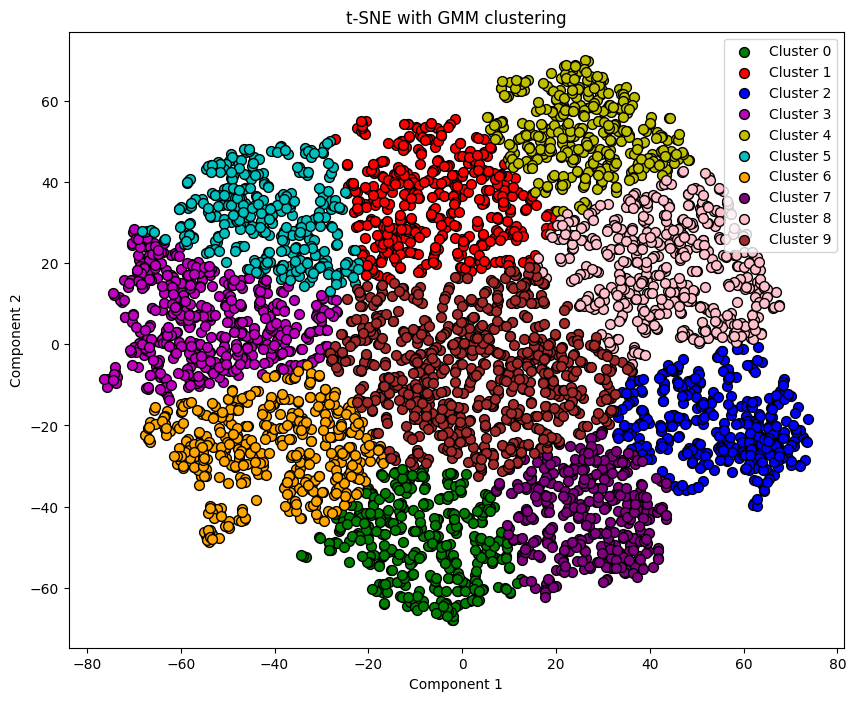

In [14]:
from custom_functions import GMM_fit

gmm_param_grid = {
    'n_components': list(range(2,12)),
    'covariance_type': ['full', 'tied', 'diag', 'spherical']
}

gmm_labels, probas, _ = GMM_fit(gmm_param_grid, X_tsne)
plot_clusters_2d(X_tsne, gmm_labels, title="t-SNE with GMM clustering")

**Attempt to replicate authors' results**

**Inspect embedding**

We inspect the embedding colored by each sample to ensure that there is no batch effect from the pooling process.

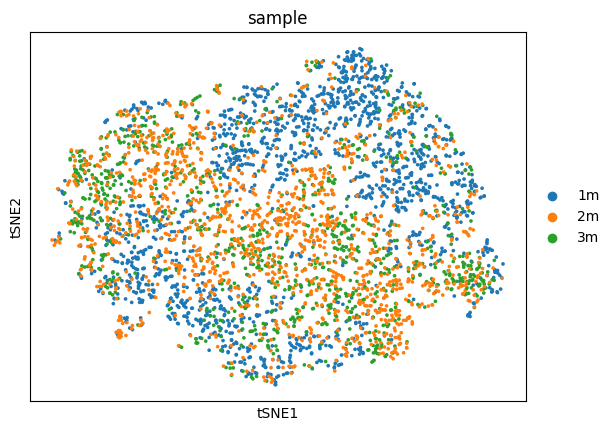

In [17]:
sc.pl.tsne(adata, color=['sample'])

**Hierarchical clustering**

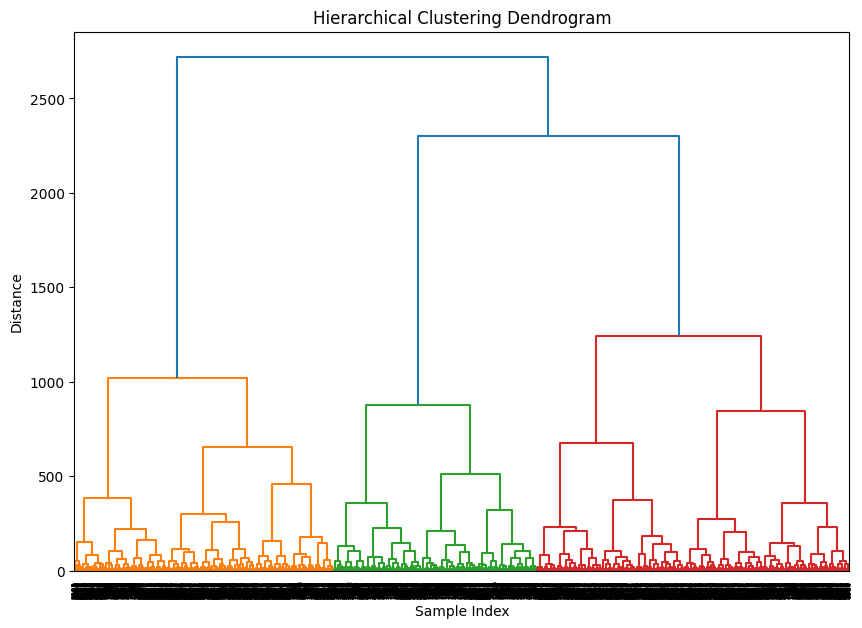

In [18]:
# Compute the distance matrix
distance_matrix = pdist(adata.obsm['X_tsne'], metric='euclidean')

# Perform hierarchical clustering
Z = linkage(distance_matrix, method='ward')

# Visualize the dendrogram
plt.figure(figsize=(10, 7))
dendrogram(Z)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Sample Index')
plt.ylabel('Distance')
plt.show()

**Assigned clusters visualization**

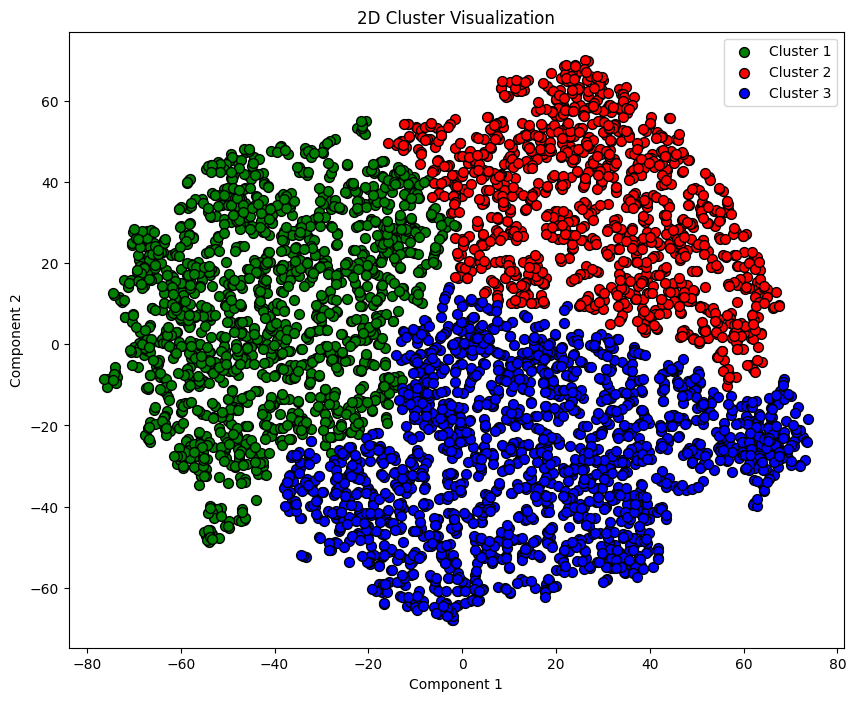

In [19]:
cluster_labels = fcluster(Z, t=3, criterion='maxclust')
plot_clusters_2d(adata.obsm['X_tsne'], cluster_labels)

**Identification of the top marker genes for each cluster**

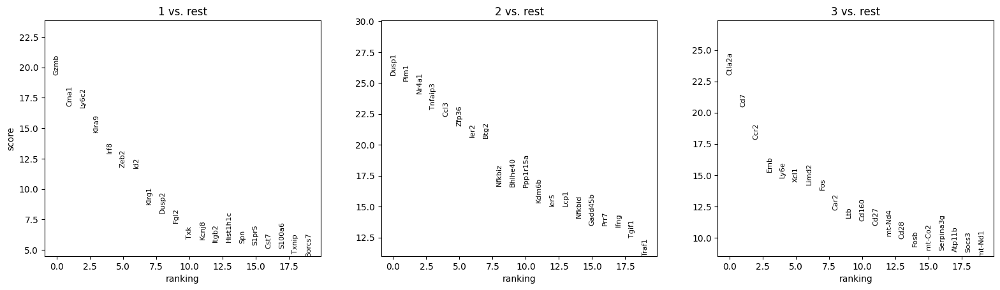

In [20]:
adata.obs['cluster_labels'] = pd.Categorical(cluster_labels)
# Identify marker genes
sc.tl.rank_genes_groups(adata, groupby='cluster_labels', method='wilcoxon', n_genes=20)

# Visualize the top marker genes
sc.pl.rank_genes_groups(adata, n_genes=20, sharey=False)

**Heatmap creation**

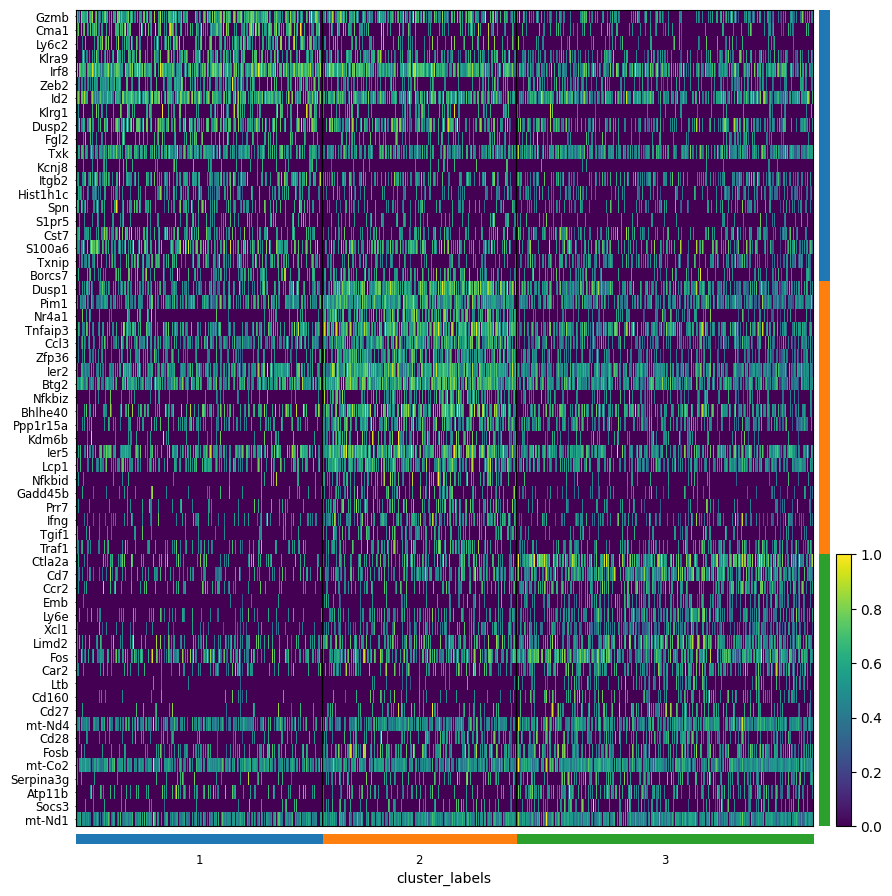

In [21]:
# Extract marker genes information
markers = adata.uns['rank_genes_groups']
cluster_key = 'cluster_labels'

adata.obs[cluster_key] = adata.obs[cluster_key].astype(str)

# Plot the marker genes using a heatmap
sc.pl.rank_genes_groups_heatmap(
    adata,
    n_genes=20,
    groupby=cluster_key,
    show_gene_labels=True,
    swap_axes = True,
    standard_scale='var',
    dendrogram=False
)

**Marker genes of each identified cluster**

In [28]:
markers = adata.uns['rank_genes_groups']['names']

cluster_1 = []
cluster_2 = []
cluster_3 = []

for gene_tuple in markers:
    cluster_1.append(gene_tuple[0])
    cluster_2.append(gene_tuple[1])
    cluster_3.append(gene_tuple[2])

print(f"Marker genes for cluster 1\n{cluster_1}\n")
print(f"Marker genes for cluster 2\n{cluster_2}\n")
print(f"Marker genes for cluster 3\n{cluster_3}\n")

Marker genes for cluster 1
['Gzmb', 'Cma1', 'Ly6c2', 'Klra9', 'Irf8', 'Zeb2', 'Id2', 'Klrg1', 'Dusp2', 'Fgl2', 'Txk', 'Kcnj8', 'Itgb2', 'Hist1h1c', 'Spn', 'S1pr5', 'Cst7', 'S100a6', 'Txnip', 'Borcs7']

Marker genes for cluster 2
['Dusp1', 'Pim1', 'Nr4a1', 'Tnfaip3', 'Ccl3', 'Zfp36', 'Ier2', 'Btg2', 'Nfkbiz', 'Bhlhe40', 'Ppp1r15a', 'Kdm6b', 'Ier5', 'Lcp1', 'Nfkbid', 'Gadd45b', 'Prr7', 'Ifng', 'Tgif1', 'Traf1']

Marker genes for cluster 3
['Ctla2a', 'Cd7', 'Ccr2', 'Emb', 'Ly6e', 'Xcl1', 'Limd2', 'Fos', 'Car2', 'Ltb', 'Cd160', 'Cd27', 'mt-Nd4', 'Cd28', 'Fosb', 'mt-Co2', 'Serpina3g', 'Atp11b', 'Socs3', 'mt-Nd1']

